# **Homework 3 - Convolutional Neural Network**

This is the example code of homework 3 of the machine learning course by Prof. Hung-yi Lee.

In this homework, you are required to build a convolutional neural network for image classification, possibly with some advanced training tips.


There are three levels here:

**Easy**: Build a simple convolutional neural network as the baseline. (2 pts)

**Medium**: Design a better architecture or adopt different data augmentations to improve the performance. (2 pts)

**Hard**: Utilize provided unlabeled data to obtain better results. (2 pts)

## **Import Packages**

First, we need to import packages that will be used later.

In this homework, we highly rely on **torchvision**, a library of PyTorch.

In [ ]:
# Import necessary packages.
import numpy as np
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
from PIL import Image
# "ConcatDataset" and "Subset" are possibly useful when doing semi-supervised learning.
from torch.utils.data import ConcatDataset, DataLoader, Subset, Dataset
from torchvision.datasets import DatasetFolder 

import matplotlib.pyplot as plt

# This is for the progress bar.
from tqdm.auto import tqdm

In [ ]:
torch.cuda.get_device_name(0)

'Tesla T4'

## **About the Dataset**

The dataset used here is food-11, a collection of food images in 11 classes.

For the requirement in the homework, TAs slightly modified the data.
Please DO NOT access the original fully-labeled training data or testing labels.

Also, the modified dataset is for this course only, and any further distribution or commercial use is forbidden.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls 'drive/MyDrive/Research Courses/Y4S2/ML - 李宏毅/HW3'

 0_60931_HW03.ckpt    HW03.pdf		   model_0.6318452.ckpt
 0.60931_HW03.ipynb   HW03_pseudo2.ipynb   ResNeXt.pdf
 food-11.zip	      HW03_pseudo.ipynb    WideResNet.pdf
 HW03.ipynb	     'HW3 log.docx'


In [ ]:
!unzip -q 'drive/MyDrive/Research Courses/Y4S2/ML - 李宏毅/HW3/food-11.zip'

In [ ]:
# Download the dataset
# You may choose where to download the data.

# Google Drive
#!gdown --id '1awF7pZ9Dz7X1jn1_QAiKN-_v56veCEKy' --output food-11.zip

# Dropbox
#!wget https://www.dropbox.com/s/m9q6273jl3djall/food-11.zip -O food-11.zip

# MEGA
#!sudo apt install megatools
#!megadl "https://mega.nz/#!zt1TTIhK!ZuMbg5ZjGWzWX1I6nEUbfjMZgCmAgeqJlwDkqdIryfg"

# Unzip the dataset.
# This may take some time.
#!unzip -q food-11.zip

In [ ]:
#np.array(Image.open('drive/MyDrive/Research Courses/Y4S2/ML - 李宏毅/HW3/0000.jpg'))

## **Dataset, Data Loader, and Transforms**

Torchvision provides lots of useful utilities for image preprocessing, data wrapping as well as data augmentation.

Here, since our data are stored in folders by class labels, we can directly apply **torchvision.datasets.DatasetFolder** for wrapping data without much effort.

Please refer to [PyTorch official website](https://pytorch.org/vision/stable/transforms.html) for details about different transforms.

In [ ]:
# It is important to do data augmentation in training.
# However, not every augmentation is useful.
# Please think about what kind of augmentation is helpful for food recognition.
train_tfm = transforms.Compose([
    #transforms.RandomCrop(size, padding=None, pad_if_needed=False, fill=0, padding_mode='constant'),
    #transforms.Resize((256, 256)),
    transforms.RandomRotation(degrees=25, expand=False, center=None, fill=0, resample=None),
    transforms.RandomResizedCrop(size=128, scale=(0.55, 1.0), ratio=(0.7, 1.5)),
    # Resize the image into a fixed shape (height = width = 128)
    # You may add some transforms here.
    # ToTensor() should be the last one of the transforms.
    transforms.ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.05),
    transforms.RandomHorizontalFlip(p=0.5),
    #transforms.RandomErasing(p=0.5, scale=(0.02, 0.33), ratio=(0.3, 3.3), value=0, inplace=False),
    transforms.ToTensor(),  # Whereas the values in the original PIL image ranged from 0 to 255 (8 bits per channel), the ToTensor transform turns the data into a 32-bit floating-point per channel, scaling the values down from 0.0 to 1.0
    transforms.Normalize((0.5462, 0.4369, 0.3265),
                         (0.2708, 0.2733, 0.2718)),
    transforms.RandomErasing(p=0.5, scale=(0.1, 0.25), ratio=(0.1, 5.0), value=0, inplace=False), # must be after normalize (https://pytorch.org/vision/stable/transforms.html)
])

# We don't need augmentations in testing and validation.
# All we need here is to resize the PIL image and transform it into Tensor.
test_tfm = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5462, 0.4369, 0.3265),
                         (0.2708, 0.2733, 0.2718)),
    
])


In [ ]:
# Batch size for training, validation, and testing.
# A greater batch size usually gives a more stable gradient.
# But the GPU memory is limited, so please adjust it carefully.
batch_size = 32

# Construct datasets.
# The argument "loader" tells how torchvision reads the data.
# imply labels from folder hierarchy
train_set = DatasetFolder("food-11/training/labeled", loader=lambda x: Image.open(x), extensions="jpg", transform=train_tfm) # augmentation is done in get_item()
valid_set = DatasetFolder("food-11/validation", loader=lambda x: Image.open(x), extensions="jpg", transform=test_tfm)
#unlabeled_set = DatasetFolder("food-11/training/unlabeled", loader=lambda x: Image.open(x), extensions="jpg", transform=train_tfm)
unlabeled_set = DatasetFolder("food-11/training/unlabeled", loader=lambda x: Image.open(x), extensions="jpg", transform=test_tfm)
test_set = DatasetFolder("food-11/testing", loader=lambda x: Image.open(x), extensions="jpg", transform=test_tfm)



In [ ]:
train_set

Dataset DatasetFolder
    Number of datapoints: 3080
    Root location: food-11/training/labeled
    StandardTransform
Transform: Compose(
               RandomRotation(degrees=[-25.0, 25.0], interpolation=nearest, expand=False, fill=0)
               RandomResizedCrop(size=(128, 128), scale=(0.55, 1.0), ratio=(0.7, 1.5), interpolation=bilinear)
               ColorJitter(brightness=[0.75, 1.25], contrast=[0.75, 1.25], saturation=[0.75, 1.25], hue=[-0.05, 0.05])
               RandomHorizontalFlip(p=0.5)
               ToTensor()
               Normalize(mean=(0.5462, 0.4369, 0.3265), std=(0.2708, 0.2733, 0.2718))
               RandomErasing()
           )

In [ ]:
# Construct data loaders.
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True, num_workers=8, pin_memory=True)
valid_loader = DataLoader(valid_set, batch_size=batch_size, shuffle=True, num_workers=8, pin_memory=True)
#test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False, num_workers=8, pin_memory=True)

#unlabeled_loader = DataLoader(unlabeled_set, batch_size=batch_size, shuffle=True, num_workers=8, pin_memory=True)
#unlabeled_loader = DataLoader(unlabeled_set, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
# Get a batch of training data
#inputs, classes = next(iter(train_loader))
images, labels = next(iter(train_loader))

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
"""
# channels first
x = True
for loader in [valid_loader, train_loader]:
  for i in range(len(loader)):
    images, labels = next(iter(loader))
    if not x:
      imgs = torch.cat((imgs, images))
    if x:
      imgs = images
      x = False
    print(imgs.shape)
"""

'\n# channels first\nx = True\nfor loader in [valid_loader, train_loader]:\n  for i in range(len(loader)):\n    images, labels = next(iter(loader))\n    if not x:\n      imgs = torch.cat((imgs, images))\n    if x:\n      imgs = images\n      x = False\n    print(imgs.shape)\n'

In [ ]:
"""
for loader in [test_loader, unlabeled_loader]:
  for i in range(len(loader)):
    images, _ = next(iter(loader))
    imgs = torch.cat((imgs, images))
    print(imgs.shape)
"""

'\nfor loader in [test_loader, unlabeled_loader]:\n  for i in range(len(loader)):\n    images, _ = next(iter(loader))\n    imgs = torch.cat((imgs, images))\n    print(imgs.shape)\n'

In [ ]:
#imgs = torch.moveaxis(imgs, 0,3)

In [ ]:
#imgs.shape

In [ ]:
#imgs.reshape(3, -1).mean(dim=1)
# tensor([0.5462, 0.4369, 0.3265]) (with augmentation)

In [ ]:
#imgs.reshape(3, -1).std(dim=1)
# tensor([0.2708, 0.2733, 0.2718])

In [ ]:
class_names = {0:'Bread', 1:'Dairy product', 2:'Dessert', 3:'Egg', 4:'Fried food', 5:'Meat', 6:'Noodles/Pasta', 7:'Rice', 8:'Seafood', 9:'Soup', 10:'Vegetable/Fruit'}

In [ ]:
def view_img(images, labels, prob=None):

    std = np.array([0.2708, 0.2733, 0.2718])
    mean = np.array([0.5462, 0.4369, 0.3265])

    plt.figure(figsize=(30, 15))
    #for images, labels in x:
    for i in range(min(32, int(images.shape[0]))): # show at most 32 images
      ax = plt.subplot(4, 8, i + 1)
      inp = images[i].numpy()
      #inp = inp*std + mean 
      inp = np.array([inp[i]*std[i] + mean[i] for i in range(3)]) 
      inp = inp.transpose((1, 2, 0))
      #plt.imshow(np.clip(inp, 0, 1))
      plt.imshow(inp)
      if prob == None:
        x = str(int(labels[i])) + '_' + class_names[int(labels[i])]
      else:
        x = '{:.2f}%'.format(float(prob[i])*100) + '  ' + str(int(labels[i])) + '_' + class_names[int(labels[i])]
        
      plt.title(x)
      plt.axis("off")

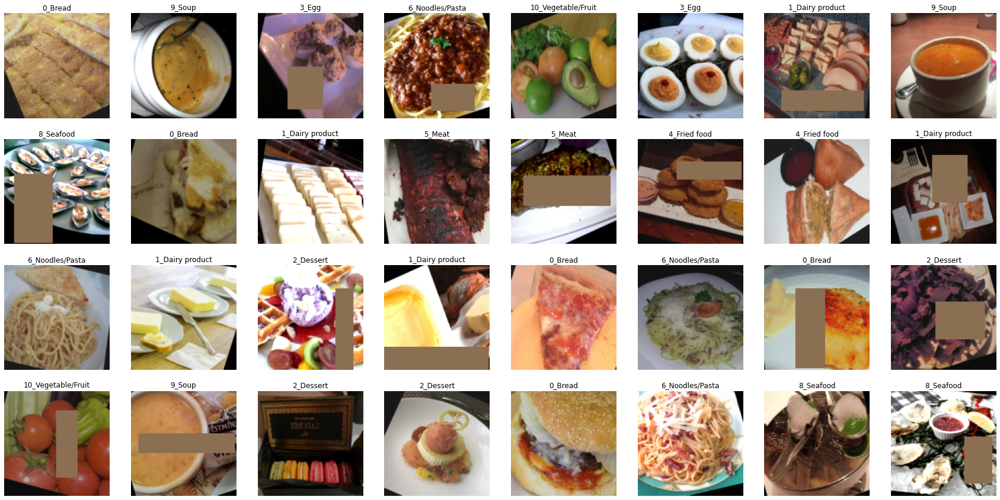

In [ ]:
view_img(images, labels)

## **Model**

The basic model here is simply a stack of convolutional layers followed by some fully-connected layers.

Since there are three channels for a color image (RGB), the input channels of the network must be three.
In each convolutional layer, typically the channels of inputs grow, while the height and width shrink (or remain unchanged, according to some hyperparameters like stride and padding).

Before fed into fully-connected layers, the feature map must be flattened into a single one-dimensional vector (for each image).
These features are then transformed by the fully-connected layers, and finally, we obtain the "logits" for each class.

### **WARNING -- You Must Know**
You are free to modify the model architecture here for further improvement.
However, if you want to use some well-known architectures such as ResNet50, please make sure **NOT** to load the pre-trained weights.
Using such pre-trained models is considered cheating and therefore you will be punished.
Similarly, it is your responsibility to make sure no pre-trained weights are used if you use **torch.hub** to load any modules.

For example, if you use ResNet-18 as your model:

model = torchvision.models.resnet18(pretrained=**False**) → This is fine.

model = torchvision.models.resnet18(pretrained=**True**)  → This is **NOT** allowed.

In [ ]:
"""
class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        # The arguments for commonly used modules:
        # torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        # torch.nn.MaxPool2d(kernel_size, stride, padding)

        # input image size: [3, 128, 128]
        self.cnn_layers = nn.Sequential(
            nn.Conv2d(3, 64, 3, 1, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2, 0),

            nn.Conv2d(64, 128, 3, 1, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2, 0),

            nn.Conv2d(128, 256, 3, 1, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.MaxPool2d(4, 4, 0),
        )
        self.fc_layers = nn.Sequential(
            nn.Linear(256 * 8 * 8, 256),
            nn.ReLU(),
            nn.Linear(256, 256),
            nn.ReLU(),
            nn.Linear(256, 11)
        )

    def forward(self, x):
        # input (x): [batch_size, 3, 128, 128]
        # output: [batch_size, 11]

        # Extract features by convolutional layers.
        x = self.cnn_layers(x)

        # The extracted feature map must be flatten before going to fully-connected layers.
        x = x.flatten(1)

        # The features are transformed by fully-connected layers to obtain the final logits.
        x = self.fc_layers(x)
        return x
"""

'\nclass Classifier(nn.Module):\n    def __init__(self):\n        super(Classifier, self).__init__()\n        # The arguments for commonly used modules:\n        # torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)\n        # torch.nn.MaxPool2d(kernel_size, stride, padding)\n\n        # input image size: [3, 128, 128]\n        self.cnn_layers = nn.Sequential(\n            nn.Conv2d(3, 64, 3, 1, 1),\n            nn.BatchNorm2d(64),\n            nn.ReLU(),\n            nn.MaxPool2d(2, 2, 0),\n\n            nn.Conv2d(64, 128, 3, 1, 1),\n            nn.BatchNorm2d(128),\n            nn.ReLU(),\n            nn.MaxPool2d(2, 2, 0),\n\n            nn.Conv2d(128, 256, 3, 1, 1),\n            nn.BatchNorm2d(256),\n            nn.ReLU(),\n            nn.MaxPool2d(4, 4, 0),\n        )\n        self.fc_layers = nn.Sequential(\n            nn.Linear(256 * 8 * 8, 256),\n            nn.ReLU(),\n            nn.Linear(256, 256),\n            nn.ReLU(),\n            nn.Linear(256, 11

## **Training**

You can finish supervised learning by simply running the provided code without any modification.

The function "get_pseudo_labels" is used for semi-supervised learning.
It is expected to get better performance if you use unlabeled data for semi-supervised learning.
However, you have to implement the function on your own and need to adjust several hyperparameters manually.

For more details about semi-supervised learning, please refer to [Prof. Lee's slides](https://speech.ee.ntu.edu.tw/~tlkagk/courses/ML_2016/Lecture/semi%20(v3).pdf).

Again, please notice that utilizing external data (or pre-trained model) for training is **prohibited**.

In [ ]:
def same_seeds(seed):
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)  
    np.random.seed(seed)  
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

In [ ]:
same_seeds(0)

In [ ]:
def plot_learning_curve(loss_record_lst, title=''):
    ''' Plot learning curve of your DNN (train & dev loss) '''
    
    #fig, ax = plt.subplots(len(loss_record_lst) +1 ,1, figsize=(6*2, 4*len(loss_record_lst)))

    for i, loss_record in enumerate(loss_record_lst):

      total_steps = len(loss_record['train'])
      x_1 = range(total_steps)
      #x_2 = x_1[::len(loss_record['train']) // len(loss_record['dev'])]
      #figure(figsize=(6*4, 4*2.5))
      fig, ax = plt.subplots(len(loss_record_lst) +1 ,2, figsize=(6*3, 4*3))
      
      #ax[i].plot(x_1, loss_record['train'], c='tab:red', label='train')
      ax[i][0].plot(x_1, loss_record['val'], c='tab:cyan', label='val')
      ax[i][0].plot(x_1, loss_record['train'], c='tab:purple', label='train')
      ax[i][0].plot(x_1, np.array(loss_record['val']) - np.array(loss_record['train']), c='tab:green', label='val-train')
      ax[i][0].set_ylim(0.0, 70.)
      #ax[i][0].set_xlabel('Training steps')
      ax[i][0].set_ylabel('MSE loss')
      ax[i][0].set_title('Learning curve of {}'.format(title + ' ' + str(i)))
      ax[i][0].legend()

      ax[i][1].plot(x_1, loss_record['val_acc'], c='tab:cyan', label='val')
      ax[i][1].plot(x_1, loss_record['train_acc'], c='tab:purple', label='train')
      #ax[i][1].set_ylim(0.5, 1.)
      ax[i][1].set_ylabel('Acc')
      ax[i][1].set_title('Acc of {}'.format(title + ' ' + str(i)))
      ax[i][1].legend()


    ax[i+1][0].plot(x_1, loss_record['lr'])
    ax[i+1][0].set_xlabel('Training steps')
    ax[i+1][0].set_ylabel('LR')

In [ ]:
class CreateDataset(Dataset):
    def __init__(self, x, y, transform=None):
        #print(x.shape)
        img = [Image.fromarray(i.cpu().numpy().astype('uint8'), 'RGB') for i in x]
        print(img)
        self.data = img
        #y = y.type(torch.int) # y 一個list內裝int，再轉成ndarray
        y = y.astype(np.int)
        self.label = y
        self.transform = transform

    def __getitem__(self, idx):
        if self.transform:
            sample = self.transform(self.data[idx])
        return sample, self.label[idx]

    def __len__(self):
        return len(self.data)

In [ ]:
# dataset = unlabelled, threshold = confidence
def get_pseudo_labels(dataset, model, threshold):
    # This functions generates pseudo-labels of a dataset using given model.
    # It returns an instance of DatasetFolder containing images whose prediction confidences exceed a given threshold.
    # You are NOT allowed to use any models trained on external data for pseudo-labeling.
    device = "cuda" if torch.cuda.is_available() else "cpu"

    labelled_y_lst = [] 
    
    #data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    data_loader = DataLoader(dataset, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)
    model.eval()
    softmax = nn.Softmax(dim=-1)

    x = True
    i, pseudo_ct = 0, 0
    #for batch in tqdm(data_loader):
    for batch in data_loader:
        #i+=1
        #if i == 100:
        #  break

        img, _ = batch
        with torch.no_grad():
            logits = model(img.to(device))
        probs = softmax(logits)
        #print('img = ', img.shape)

        # ---------- TODO ----------
        # Filter the data and construct a new dataset.
        max_prob, max_idx = torch.max(probs, dim=1)
        #print('max_idx.type', max_idx.type)
        if max_prob > threshold[0] and max_prob < threshold[1]:
            pseudo_ct+=1
            #img = torch.squeeze(img)
            img = img.cpu()
            #max_idx = int(max_idx.cpu())#.type(torch.int)
            max_idx = max_idx.cpu()#.item()

            labelled_y_lst.append(max_idx)
            
            if not x:
              labelled_x = torch.cat((labelled_x, img))
              #labelled_y = torch.cat((labelled_y, max_idx))
              max_prob_y = torch.cat((max_prob_y, max_prob))
            if x:
              labelled_x = img
              #labelled_y = max_idx
              max_prob_y = max_prob
              x = False

    #labelled_y = torch.from_numpy(np.array(labelled_y_lst))
    labelled_y = np.array(labelled_y_lst)
    ds = CreateDataset(labelled_x, labelled_y, transform=train_tfm)
    print('[Info]  ' + str(pseudo_ct) + ' ' + '({:2.3f}'.format(pseudo_ct*100/6786) + ')%  images are added into the pseudo_label dataset')
    #print('labelled_x.shape = ', labelled_x.shape, '  ', 'labelled_y.shape = ', labelled_y.shape)
    view_img(labelled_x, labelled_y, max_prob_y)

    # # Turn off the eval mode.
    model.train()
    return ds

In [ ]:
 def val(valid_loader, model, device):
    model.eval()
    valid_loss, val_accs = [], []

    #for batch in tqdm(valid_loader):
    for batch in valid_loader:
        imgs, labels = batch

        with torch.no_grad(): # No need grad in val, using torch.no_grad() accelerates the forward process.
          logits = model(imgs.to(device))
        loss = criterion(logits, labels.to(device)) # We can still compute the loss (but not the gradient).

        acc = (logits.argmax(dim=-1) == labels.to(device)).float().mean()
        valid_loss.append(loss.item())
        val_accs.append(acc)

    valid_loss = sum(valid_loss) / len(valid_loss)
    val_acc = sum(val_accs) / len(val_accs)

    return val_acc, valid_loss

In [38]:
model_path = './model.ckpt'
resume_training = True

config = {
    'LR':0.1,
    'early_stop': 20,
    'lr_scheduler2': 'ReduceLROnPlateau',
    'scheduler2_hparas': {
        'mode': 'max',
        'factor': 0.1,
        'patience': 10,
        'threshold': 0.000001,
        'min_lr':0.001/10,
        'verbose': True
        },
    }

In [39]:
device = "cuda" if torch.cuda.is_available() else "cpu"

#model = Classifier().to(device)
model = torchvision.models.resnext101_32x8d(pretrained=False).to(device)
model.device = device
print('Num Params = ', sum(p.numel() for p in model.parameters() if p.requires_grad)) 

# Resume training using checkpoint
if resume_training:
    model.load_state_dict(torch.load('drive/MyDrive/Research Courses/Y4S2/ML - 李宏毅/HW3/0_60931_HW03.ckpt'))
    config['LR'] /= 100

criterion = nn.CrossEntropyLoss()
#optimizer = torch.optim.Adam(model.parameters(), lr=0.0003, weight_decay=1e-5)
optimizer = torch.optim.SGD(model.parameters(), 
                            lr=config['LR'],
                            momentum=0.9,
                            weight_decay=0.0001,
                            nesterov=True)
scheduler2 = getattr(torch.optim.lr_scheduler, config['lr_scheduler2'])(
                    optimizer, **config['scheduler2_hparas'])
n_epochs = 1000
do_semi = True

Num Params =  88791336


In [40]:
#pseudo_set = get_pseudo_labels(unlabeled_set, model, threshold=[0.97, 0.999])

In [41]:
#train_set

In [42]:
#concat_dataset = ConcatDataset([train_set, pseudo_set])

In [43]:
#train_loader = DataLoader(concat_dataset, batch_size=batch_size, shuffle=True, num_workers=8, pin_memory=True)

In [44]:
#for images, labels in train_loader:
#  print(images)
#  print(images.type)

[<PIL.Image.Image image mode=RGB size=128x3 at 0x7F041C369E90>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041C369AD0>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041C369950>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A959590>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A959950>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A959350>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A9597D0>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A959C90>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A9593D0>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A959DD0>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A959E10>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A959ED0>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041B8C7790>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041B8C7510>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041B8C7710>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041B

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[001/1000] Train Acc: 0.410822 Loss: 20.892667 | Val Acc: 0.539881 loss: 1.438230
saving model with acc 0.5398809
[002/1000] Train Acc: 0.420197 Loss: 76.077640 | Val Acc: 0.565774 loss: 1.416707
saving model with acc 0.5657738
[003/1000] Train Acc: 0.443388 Loss: 7.152256 | Val Acc: 0.577679 loss: 1.315724
saving model with acc 0.5776786
[004/1000] Train Acc: 0.435921 Loss: 41.052831 | Val Acc: 0.584524 loss: 1.313550
saving model with acc 0.5845238
[<PIL.Image.Image image mode=RGB size=128x3 at 0x7F04198D6750>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F0411F26810>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F0411F26C50>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F0418BD1190>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F0419B34190>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041A398F10>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041B960910>, <PIL.Image.Image image mode=RGB size=128x3 at 0x7F041B960D10>, <PIL.Image.Image image mode=RGB size=128

KeyboardInterrupt: ignored

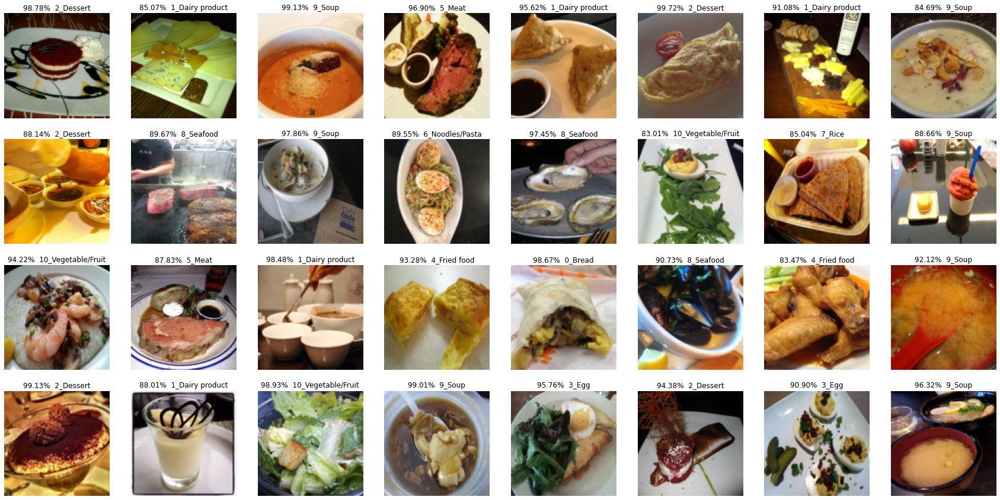

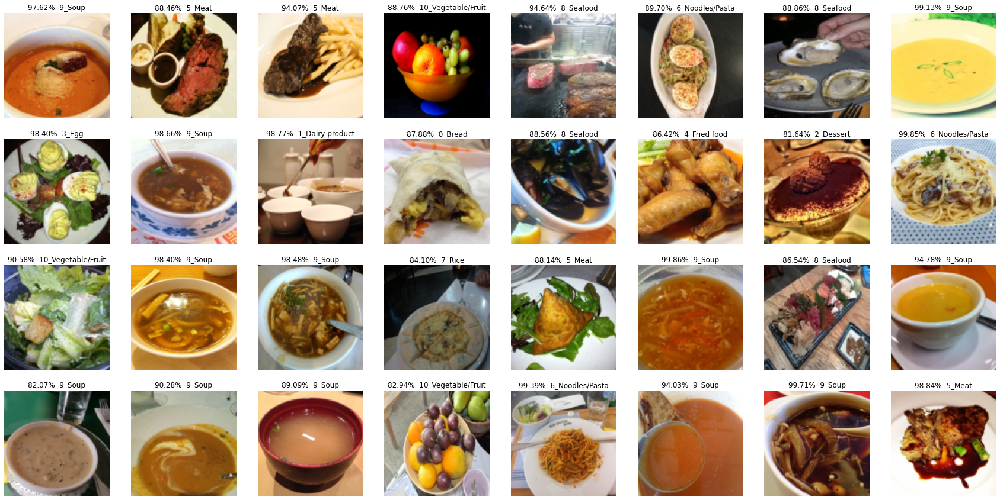

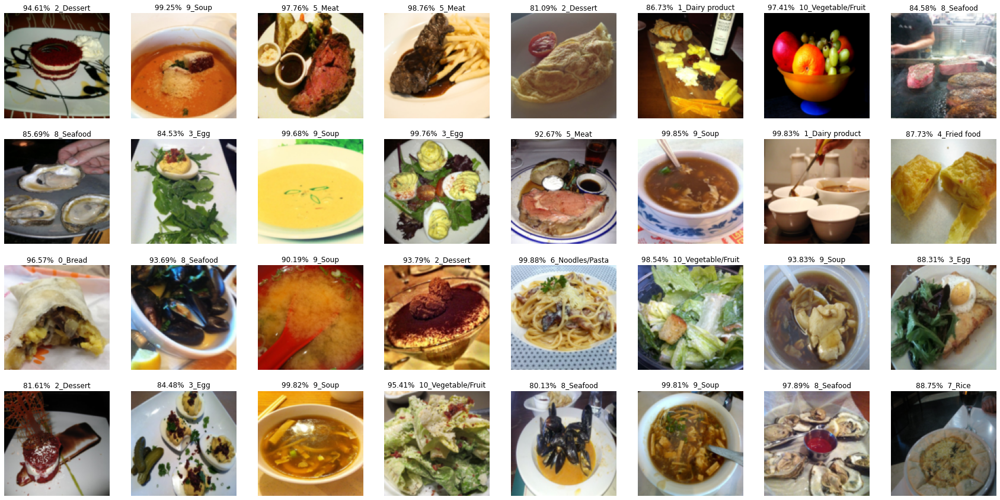

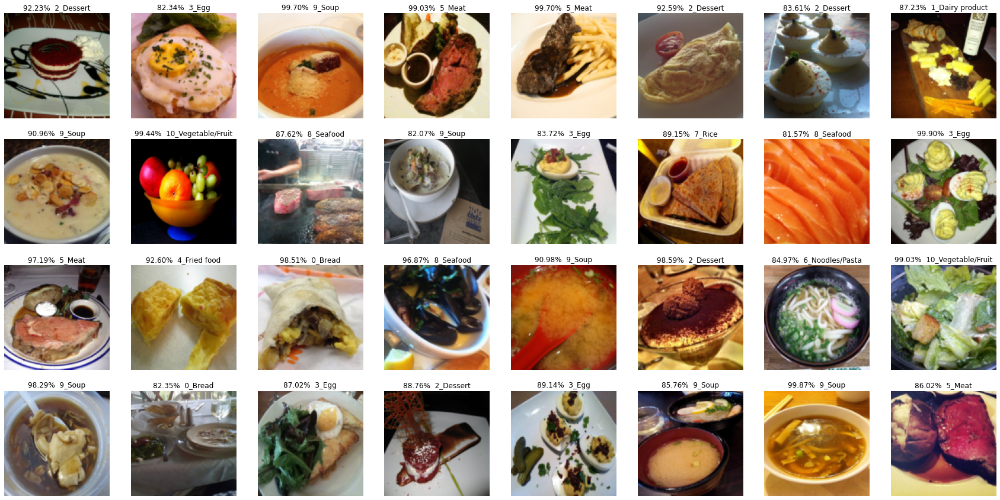

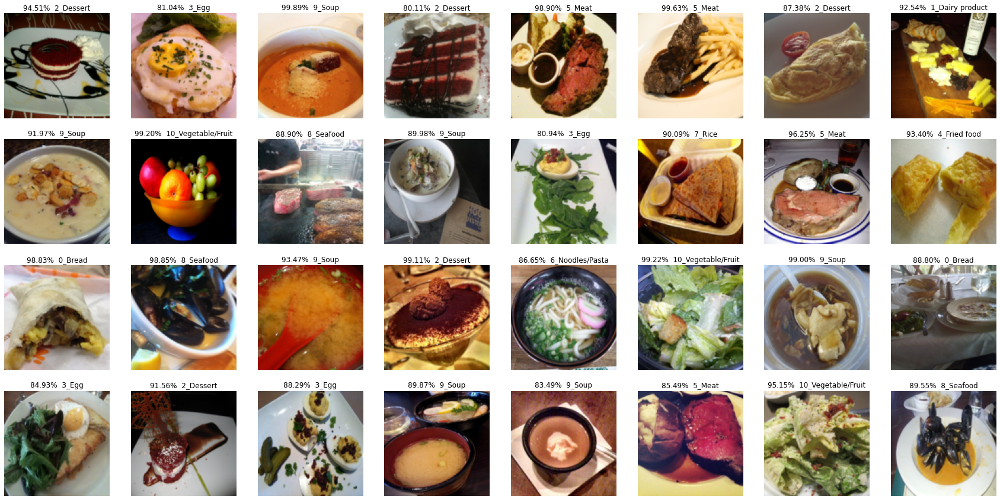

In [45]:
best_acc, val_acc, improvement = 0.0, 0.0, 0.0
acc_at_pseudo = 1.0
loss_record = {'train': [], 'val': [], 'train_acc': [], 'val_acc': [], 'lr': []}
early_stop_cnt = 0

for epoch in range(n_epochs):
    # ---------- TODO ----------
    # In each epoch, relabel the unlabeled dataset for semi-supervised learning.
    # Then you can combine the labeled dataset and pseudo-labeled dataset for the training.
    # improvement = (val_acc - acc_at_pseudo)*100 / acc_at_pseudo
    new_img = (val_acc - acc_at_pseudo)*6786
    if do_semi and (new_img > 300 or epoch==0 or early_stop_cnt > 7):
        # Obtain pseudo-labels for unlabeled data using trained model.
        pseudo_set = get_pseudo_labels(unlabeled_set, model, threshold=[0.8, 0.999])

        # Construct a new dataset and a data loader for training.
        # This is used in semi-supervised learning only.
        concat_dataset = ConcatDataset([train_set, pseudo_set])
        train_loader = DataLoader(concat_dataset, batch_size=batch_size, shuffle=True, num_workers=8, pin_memory=True)
        acc_at_pseudo = val_acc

        early_stop_cnt = 0

    model.train()
    #train_loss, train_accs = [], []
    data_ct = 0
    #for batch in tqdm(train_loader):
    for batch in train_loader:
        imgs, labels = batch
        logits = model(imgs.to(device)) # make sure model & data on the same device
        loss = criterion(logits, labels.to(device))
       
        optimizer.zero_grad() # Gradients stored in the parameters in the previous step should be cleared out first.
        loss.backward() # Compute the gradients for parameters.
        grad_norm = nn.utils.clip_grad_norm_(model.parameters(), max_norm=10) # Clip the gradient norms for stable training.
        optimizer.step() # update params with computed grad

        data_ct+=1
        """
        acc = (logits.argmax(dim=-1) == labels.to(device)).float().mean()
        train_loss.append(loss.item())
        train_accs.append(acc)
    train_loss = sum(train_loss) / len(train_loss)
    train_acc = sum(train_accs) / len(train_accs)
    """
    
    scheduler2.step(val_acc)

    lr = optimizer.param_groups[0]['lr']
    loss_record['lr'].append(lr)

    train_acc, train_loss = val(train_loader, model, device)
    val_acc, val_loss = val(valid_loader, model, device)
    loss_record['val'].append(val_loss)
    loss_record['train'].append(train_loss)
    loss_record['val_acc'].append(val_acc)
    loss_record['train_acc'].append(train_acc)

    #print(f"[ Train | {epoch + 1:03d}/{n_epochs:03d} ] loss = {train_loss:.5f}, acc = {train_acc:.5f}")
    print('[{:03d}/{:03d}] Train Acc: {:3.6f} Loss: {:3.6f} | Val Acc: {:3.6f} loss: {:3.6f}'.format(
        epoch + 1, n_epochs, train_acc, train_loss, val_acc, val_loss 
    ))

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(), model_path)
        print('saving model with acc {:.7f}'.format(best_acc))#/len(val_set)))
        early_stop_cnt = 0
    else:
        early_stop_cnt += 1

    if epoch==0:
          acc_at_pseudo = val_acc

    if early_stop_cnt > config['early_stop']:
        break
    #print(f"[ Valid | {epoch + 1:03d}/{n_epochs:03d} ] loss = {valid_loss:.5f}, acc = {val_acc:.5f}")

In [ ]:
x

In [ ]:
data_ct*batch_size

In [ ]:
plot_learning_curve([loss_record])

## **Testing**

For inference, we need to make sure the model is in eval mode, and the order of the dataset should not be shuffled ("shuffle=False" in test_loader).

Last but not least, don't forget to save the predictions into a single CSV file.
The format of CSV file should follow the rules mentioned in the slides.

### **WARNING -- Keep in Mind**

Cheating includes but not limited to:
1.   using testing labels,
2.   submitting results to previous Kaggle competitions,
3.   sharing predictions with others,
4.   copying codes from any creatures on Earth,
5.   asking other people to do it for you.

Any violations bring you punishments from getting a discount on the final grade to failing the course.

It is your responsibility to check whether your code violates the rules.
When citing codes from the Internet, you should know what these codes exactly do.
You will **NOT** be tolerated if you break the rule and claim you don't know what these codes do.


In [46]:
# create model and load weights from checkpoint
model = torchvision.models.resnext101_32x8d(pretrained=False).to(device)
model.load_state_dict(torch.load(model_path))

<All keys matched successfully>

In [47]:
# Make sure the model is in eval mode.
# Some modules like Dropout or BatchNorm affect if the model is in training mode.
model.eval()

# Initialize a list to store the predictions.
predictions = []

# Iterate the testing set by batches.
#for batch in tqdm(test_loader):
for batch in test_loader:
    # A batch consists of image data and corresponding labels.
    # But here the variable "labels" is useless since we do not have the ground-truth.
    # If printing out the labels, you will find that it is always 0.
    # This is because the wrapper (DatasetFolder) returns images and labels for each batch,
    # so we have to create fake labels to make it work normally.
    imgs, labels = batch

    # We don't need gradient in testing, and we don't even have labels to compute loss.
    # Using torch.no_grad() accelerates the forward process.
    with torch.no_grad():
        logits = model(imgs.to(device))

    # Take the class with greatest logit as prediction and record it.
    predictions.extend(logits.argmax(dim=-1).cpu().numpy().tolist())

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [48]:
# Save predictions into the file.
with open("predict.csv", "w") as f:

    # The first row must be "Id, Category"
    f.write("Id,Category\n")

    # For the rest of the rows, each image id corresponds to a predicted class.
    for i, pred in  enumerate(predictions):
         f.write(f"{i},{pred}\n")